In [1]:
import pandas as pd
import numpy as np 
import scipy.stats as st
import matplotlib.pyplot as plt
from matplotlib.projections import PolarAxes
import seaborn as sns
from shapely.geometry import MultiPoint, box, Point, LineString
from geopy.distance import geodesic
import folium
import folium, json, requests
from folium.plugins import HeatMap
from folium.plugins import TimestampedGeoJson
from folium.plugins import FastMarkerCluster
import geopandas as gpd, shapely, folium
import osmnx as ox
from math import radians, degrees, atan2
from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from hmmlearn.hmm import GaussianHMM
import hdbscan, geopandas as gpd
from shapely.geometry import MultiPoint
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers  import LSTM, Dense

from IPython.display import Image
from tqdm import tqdm
import warnings
warnings.filterwarnings("ignore")
df = pd.read_csv('gps_pigeon.csv')

<a name="table_of_contents"></a>
[Этап 1. Разведочный анализ(EDA)](#stage_1)

- [1.1. Временной анализ](#s_1.1)

- [1.2. Пространственный анализ](#s_1.2)

- [1.3 Поведенческий анализ (на основе флагов)](#s_1.3)

- [1.4 Аномалии](#s_1.4)

[Этап 2. Геовизуализация](#stage_2)

- [2.1. Статические карты](#s_2.1)

- [2.2. Анимации](#s_2.2)

[Этап 3. Обнаружение аномалий](#stage_3)

- [3.1. По скорости и времени](#s_3.1)

- [3.2. Кластеризация](#s_3.2)

- [3.3. Radius of Gyration / Entropy](#s_3.3)

[Этап 4. Поведенческое моделирование](#stage_4)

- [4.1. Hidden Markov Models (HMM)](#s_4.1)


Предыстория: какое-то время, пока жил в Санкт-Петербурге, заметил, что один голубь постоянно сидит на моем окне. Я его стал подкармливать, от чего он стал постоянно сидеть у моего окна в ожидании еды. Мне стало интересно как он живет и где бывает - много ли мест посещает в Питере, вылетает ли за пределы города? Поэтому прикрепил к нему дешевый gps трекер и он с ним пролетал год.
Я списал данные за декабрь 2023, когда трекер только поставил, их все равно мало было и решил взять данные с начала 2024 года и до февраля 2025

In [2]:
df

,timestamp,latitude,longitude,speed_mps,status
0,2024-01-17 00:00:00,59.893818,30.009118,0.246676,rest
1,2024-01-17 00:01:00,59.898050,30.334309,0.422323,rest
2,2024-01-17 00:02:00,59.878102,30.307432,0.463045,rest
3,2024-01-17 00:03:00,59.893498,30.310354,0.550508,rest
4,2024-01-17 00:04:00,59.865657,30.324459,0.204281,rest
...,...,...,...,...,...
551516,2025-02-02 23:56:00,59.882297,30.357738,0.273695,rest
551517,2025-02-02 23:57:00,59.882960,30.343350,0.170004,rest
551518,2025-02-02 23:58:00,59.892112,30.330990,0.411362,rest
551519,2025-02-02 23:59:00,59.895164,30.359261,0.619493,rest


<a name="stage_1"></a>
## 1. EDA
[К оглавлению](#table_of_contents)

<a name="#s_1.1"></a>
### 1.1. Временной анализ активности
[К оглавлению](#table_of_contents)

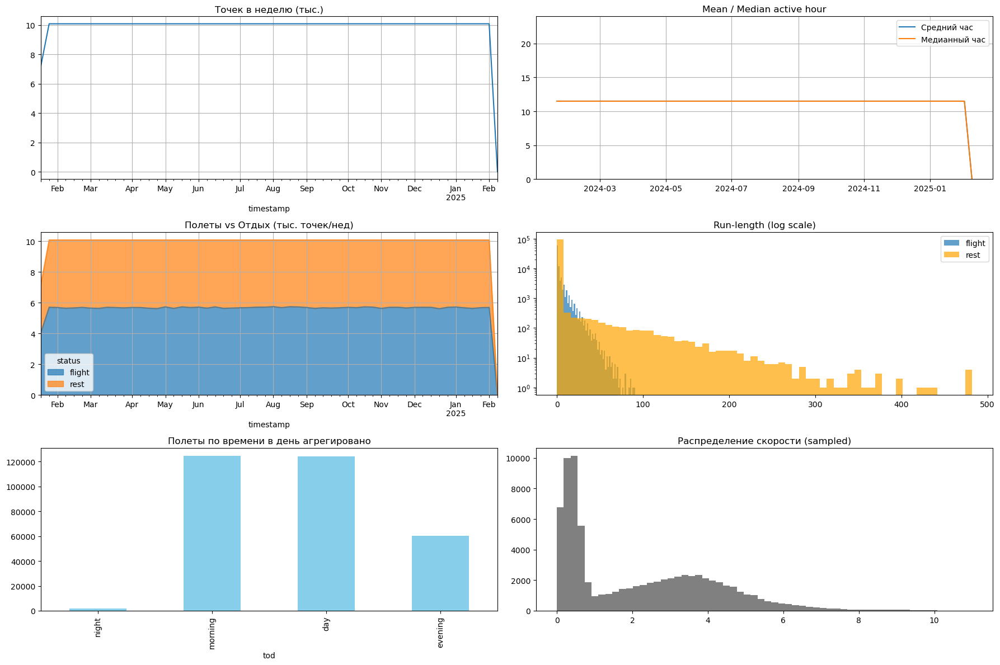

In [3]:
df['timestamp'] = pd.to_datetime(df['timestamp'])
df = df.sort_values('timestamp')
df['hour'] = df['timestamp'].dt.hour
df['date'] = df['timestamp'].dt.date    


weekly_counts = (
    df.set_index('timestamp')
      .resample('W')['speed_mps']
      .count()
)

weekly_hour_mean    = df.groupby(pd.Grouper(key='timestamp', freq='W'))['hour'].mean()
weekly_hour_median  = df.groupby(pd.Grouper(key='timestamp', freq='W'))['hour'].median()

weekly_status = (
    df.groupby([pd.Grouper(key='timestamp', freq='W'), 'status'])
      .size()
      .unstack(fill_value=0)
)

runs = df['status'].ne(df['status'].shift()).cumsum()
run_lengths = (df.groupby(runs)['status']
                 .value_counts()
                 .unstack(fill_value=0)
                 .rename(columns={'flight':'length_f','rest':'length_r'}))

def tod(h): return ('night','morning','day','evening')[(h//6)%4]
df['tod'] = df['hour'].map(tod)
flight_tod = (df[df['status']=='flight']
              .groupby('tod').size()
              .reindex(['night','morning','day','evening']))

speed_sample = df['speed_mps'].sample(n=80_000, random_state=1)

fig, axes = plt.subplots(3,2,figsize=(18,12)); axes=axes.flatten()

(weekly_counts/1000).plot(ax=axes[0])
axes[0].set_title('Точек в неделю (тыс.)'); axes[0].grid(True)

axes[1].plot(weekly_hour_mean,  label='Средний час')
axes[1].plot(weekly_hour_median,label='Медианный час')
axes[1].set_ylim(0,24); axes[1].set_title('Mean / Median active hour')
axes[1].legend(); axes[1].grid(True)

(weekly_status/1000).plot.area(ax=axes[2], alpha=.7)
axes[2].set_title('Полеты vs Отдых (тыс. точек/нед)'); axes[2].grid(True)

axes[3].hist(run_lengths['length_f'], bins=60, alpha=.7, label='flight')
axes[3].hist(run_lengths['length_r'], bins=60, alpha=.7, label='rest', color='orange')
axes[3].set_yscale('log'); axes[3].set_title('Run-length (log scale)')
axes[3].legend()

# 5. TOD только полёты
flight_tod.plot(kind='bar', ax=axes[4], color='skyblue')
axes[4].set_title('Полеты по времени в день агрегировано')

# 6. скорость
axes[5].hist(speed_sample, bins=60, color='gray')
axes[5].set_title('Распределение скорости (sampled)')

plt.tight_layout(); plt.show()

1. Точек в неделю (тыс.)
- Данные собирались равномерно в течение почти всего года. Начало и конец содержат неполные недели, поэтому их стоит исключить при строгой временной агрегации.

2. Средний и медианный активный час
- Среднее и медианное время активности остаются стабильными, около 12:00. Это может указывать на дневной характер поведения, с пиковыми перемещениями в середине дня.

3. Полёты и отдых (по неделям)
- Баланс между состояниями полёт и отдых стабилен на протяжении всего периода. Отсутствие сезонных колебаний свидетельствует о регулярной структуре активности.

4. Длина непрерывных серий (логарифмическая шкала)
- Большинство серий как полётов, так и стоянок укладываются в интервал до 30 минут. Однако присутствуют и более длинные последовательности — это может отражать длительные перемещения (миграции) и продолжительный отдых.

5. Полёты по времени суток
- Полёты почти полностью сконцентрированы в утренние и дневные часы. Ночная активность минимальна, что соответствует типичному поведению дневных птиц.

6. Распределение скоростей
- Распределение скоростей имеет пик в зоне менее 1 м/с (покой). Полёты варьируются в диапазоне 2–6 м/с, с отдельными выбросами до 10 м/с. Это подтверждает наличие как коротких перемещений, так и более активных фаз полёта.

<a name="#s_1.2"></a>
### 1.2 Пространственный анализ
[К оглавлению](#table_of_contents)

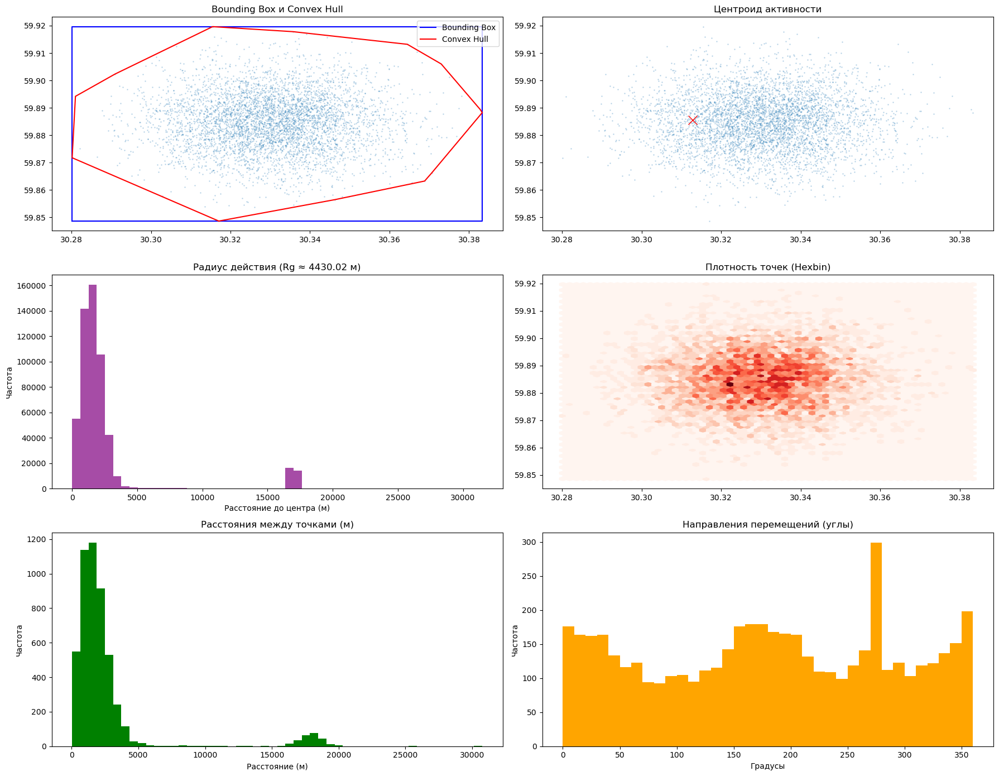

In [4]:
df_sorted = df.sort_values('timestamp').reset_index(drop=True)

lat = df_sorted['latitude'].values
lon = df_sorted['longitude'].values

lat_next = np.roll(lat, -1); lat_next[-1] = np.nan
lon_next = np.roll(lon, -1); lon_next[-1] = np.nan

def haversine_vector(lat1, lon1, lat2, lon2):
    R = 6371000
    lat1, lon1, lat2, lon2 = map(np.radians, [lat1, lon1, lat2, lon2])
    dlat = lat2 - lat1
    dlon = lon2 - lon1
    a = np.sin(dlat / 2)**2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon / 2)**2
    return 2 * R * np.arcsin(np.sqrt(a))

df_sorted['dist_m'] = haversine_vector(lat, lon, lat_next, lon_next)

centroid_lat = np.mean(lat)
centroid_lon = np.mean(lon)
df_sorted['dist_to_center'] = haversine_vector(lat, lon, centroid_lat, centroid_lon)
r_g = np.sqrt(np.mean(df_sorted['dist_to_center']**2))

lat1, lon1 = np.radians(lat), np.radians(lon)
lat2, lon2 = np.radians(lat_next), np.radians(lon_next)
dlon = lon2 - lon1
x = np.sin(dlon) * np.cos(lat2)
y = np.cos(lat1) * np.sin(lat2) - np.sin(lat1) * np.cos(lat2) * np.cos(dlon)
df_sorted['bearing'] = (np.degrees(np.arctan2(x, y)) + 360) % 360

sample_df = df_sorted.sample(n=5000, random_state=42)
sample_sorted = df_sorted.sample(n=5000, random_state=42)

points = MultiPoint(list(zip(sample_df['longitude'], sample_df['latitude'])))
bbox = points.envelope
hull = points.convex_hull
bbox_x, bbox_y = bbox.exterior.xy
hull_x, hull_y = hull.exterior.xy

centroid = (df_sorted['latitude'].mean(), df_sorted['longitude'].mean())

r_g = np.sqrt(np.mean(df_sorted['dist_to_center']**2))

fig, axes = plt.subplots(3, 2, figsize=(18, 14))
axes = axes.flatten()

# 1. Bounding Box и Convex Hull
axes[0].scatter(sample_df['longitude'], sample_df['latitude'], s=1, alpha=0.2)
axes[0].plot(bbox_x, bbox_y, label='Bounding Box', color='blue')
axes[0].plot(hull_x, hull_y, label='Convex Hull', color='red')
axes[0].set_title("Bounding Box и Convex Hull")
axes[0].legend()

# 2. Центроид активности
axes[1].scatter(sample_df['longitude'], sample_df['latitude'], s=1, alpha=0.2)
axes[1].plot(centroid[1], centroid[0], 'rx', markersize=12)
axes[1].set_title("Центроид активности")

# 3. Радиус действия
axes[2].hist(df_sorted['dist_to_center'], bins=50, color='purple', alpha=0.7)
axes[2].set_title(f"Радиус действия (Rg ≈ {r_g:.2f} м)")
axes[2].set_xlabel("Расстояние до центра (м)")
axes[2].set_ylabel("Частота")

# 4. Плотность точек (Hexbin — быстро и визуально ясно)
axes[3].hexbin(sample_df['longitude'], sample_df['latitude'], gridsize=60, cmap="Reds")
axes[3].set_title("Плотность точек (Hexbin)")

# 5. Расстояния между точками
axes[4].hist(sample_sorted['dist_m'].dropna(), bins=50, color='green')
axes[4].set_title("Расстояния между точками (м)")
axes[4].set_xlabel("Расстояние (м)")
axes[4].set_ylabel("Частота")

# 6. Направления перемещений
axes[5].hist(sample_sorted['bearing'].dropna(), bins=36, range=(0, 360), color='orange')
axes[5].set_title("Направления перемещений (углы)")
axes[5].set_xlabel("Градусы")
axes[5].set_ylabel("Частота")

plt.tight_layout()
plt.show()

1. Bounding Box и Convex Hull
- На первом графике показаны географические границы активности:

    * Синяя рамка — минимальный прямоугольник, охватывающий все точки.

    * Красный контур — выпуклая оболочка, более точно отражающая внешний контур ареала.

2. Центроид активности
- Центральная точка активности (красный крест) находится ближе к южной части ареала, что может говорить о смещении гнездового или наиболее посещаемого участка.

3. Радиус действия (Radius of Gyration)
- Гистограмма расстояний от каждой точки до центра активности. Основная масса точек укладывается в радиус 1–2 км.

- Радиус действия (Rg): ≈ 4.43 км — это ключевая метрика, показывающая «размах» перемещений.

4. Пространственная плотность (Hexbin)
- На плотностной карте видно ядро активности — наиболее часто посещаемая зона (темно-красные участки).
Это может быть кормовая база, место ночёвки или другой значимый объект.

5. Расстояния между точками
- Большинство перемещений кратки — до 500 метров. Это соответствует либо стоянкам, либо локальным передвижениям внутри ареала.

6. Направления перемещений (углы)
- Гистограмма углов показывает, что перемещения относительно равномерны по направлениям, но есть выраженный пик на восток-северо-восток (~80–90°), что может быть связано с преобладающим маршрутом.

<a name="#s_1.3"></a>
### 1.3 Поведенческий анализ (на основе флагов)
[К оглавлению](#table_of_contents)

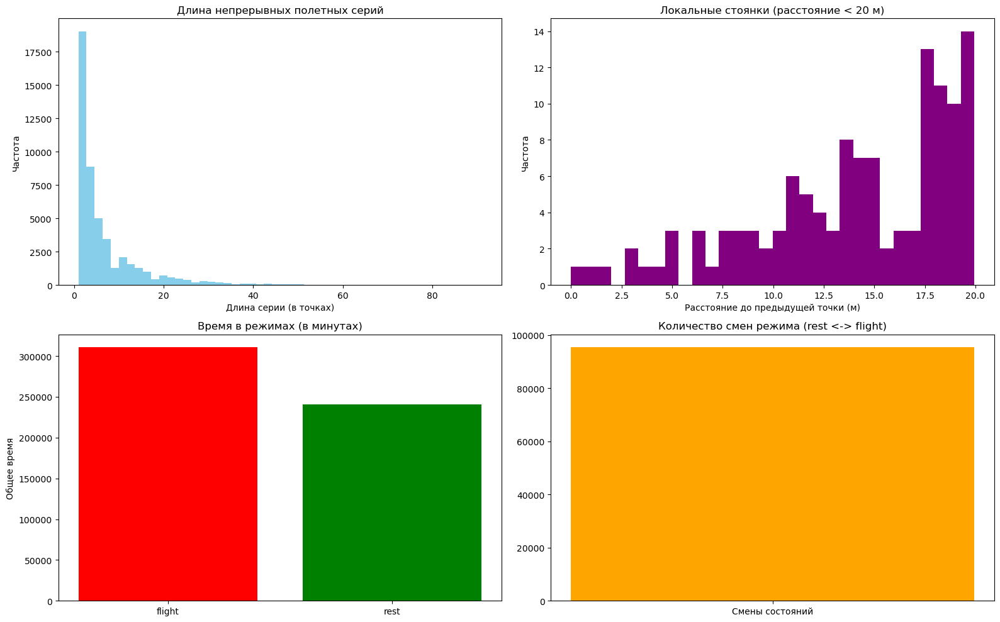

In [5]:
df['ts_next'] = df['timestamp'].shift(-1)
df['delta_min'] = (df['ts_next'] - df['timestamp']).dt.total_seconds() / 60

time_by_status = df.groupby('status')['delta_min'].sum()

status_shift = df['status'] != df['status'].shift()

df['run_id'] = df['status'].ne(df['status'].shift()).cumsum()
run_lengths = df.groupby('run_id').agg(
    status_group=('status', 'first'),
    length=('timestamp', 'count')
).reset_index()

flight_only_runs = run_lengths[run_lengths['status_group'] == 'flight']

if 'dist_prev' not in df.columns:
    from geopy.distance import geodesic
    df['lat_prev'] = df['latitude'].shift()
    df['lon_prev'] = df['longitude'].shift()

    def haversine(p1, p2):
        return geodesic(p1, p2).meters

    df['dist_prev'] = [
        haversine((lat1, lon1), (lat2, lon2)) if not pd.isnull(lat2) else 0
        for lat1, lon1, lat2, lon2 in zip(
            df['latitude'], df['longitude'],
            df['lat_prev'], df['lon_prev']
        )
    ]

stuck = df[(df['status'] == 'rest') & (df['dist_prev'] < 20)]

df['ts_next'] = df['timestamp'].shift(-1)
df['delta_min'] = (df['ts_next'] - df['timestamp']).dt.total_seconds() / 60
time_by_status = df.groupby('status')['delta_min'].sum()

status_shift = df['status'] != df['status'].shift()
status_switches = status_shift.sum()

fig, axes = plt.subplots(2, 2, figsize=(16, 10))
axes = axes.flatten()

axes[0].hist(flight_only_runs['length'], bins=50, color='skyblue')
axes[0].set_title("Длина непрерывных полетных серий")
axes[0].set_xlabel("Длина серии (в точках)")
axes[0].set_ylabel("Частота")

axes[1].hist(stuck['dist_prev'], bins=30, color='purple')
axes[1].set_title("Локальные стоянки (расстояние < 20 м)")
axes[1].set_xlabel("Расстояние до предыдущей точки (м)")
axes[1].set_ylabel("Частота")

axes[2].bar(time_by_status.index, time_by_status.values, color=['red', 'green'])
axes[2].set_title("Время в режимах (в минутах)")
axes[2].set_ylabel("Общее время")

axes[3].bar(['Смены состояний'], [status_switches], color='orange')
axes[3].set_title("Количество смен режима (rest <-> flight)")

plt.tight_layout()
plt.show()


1. Длина непрерывных полётных серий
- На гистограмме видно, что большинство полётов состоят из коротких серий:

    * Основной объём — это 1–5 минутные фрагменты.

    * Длинные перелёты (20+ точек) — редкое исключение, что соответствует модели с частыми посадками.

2. Локальные стоянки (расстояние < 20 м)
- Показано распределение стоянок, где голубь перемещался менее чем на 20 метров.

- Это свидетельствует о зонах отдыха, кормления или гнездования, часто посещаемых в рамках одного кластера.

3. Общее время в режимах (в минутах)
- Полёт (flight) — преобладает по длительности, что может указывать на активный характер маршрутов.

- Покой (rest) — также занимает значительную часть, особенно в дневное и вечернее время.

4. Количество смен режимов
- Почти 100 тыс. переходов между состояниями flight и rest указывает на высокую динамичность поведения, постоянное чередование активности и отдыха.

<a name="#s_1.4"></a>
### 1.4 Аномалии 
[К оглавлению](#table_of_contents)

Jump distance: 100%|██████████████████████████████████████████████████████| 551521/551521 [00:00<00:00, 1414194.93it/s]


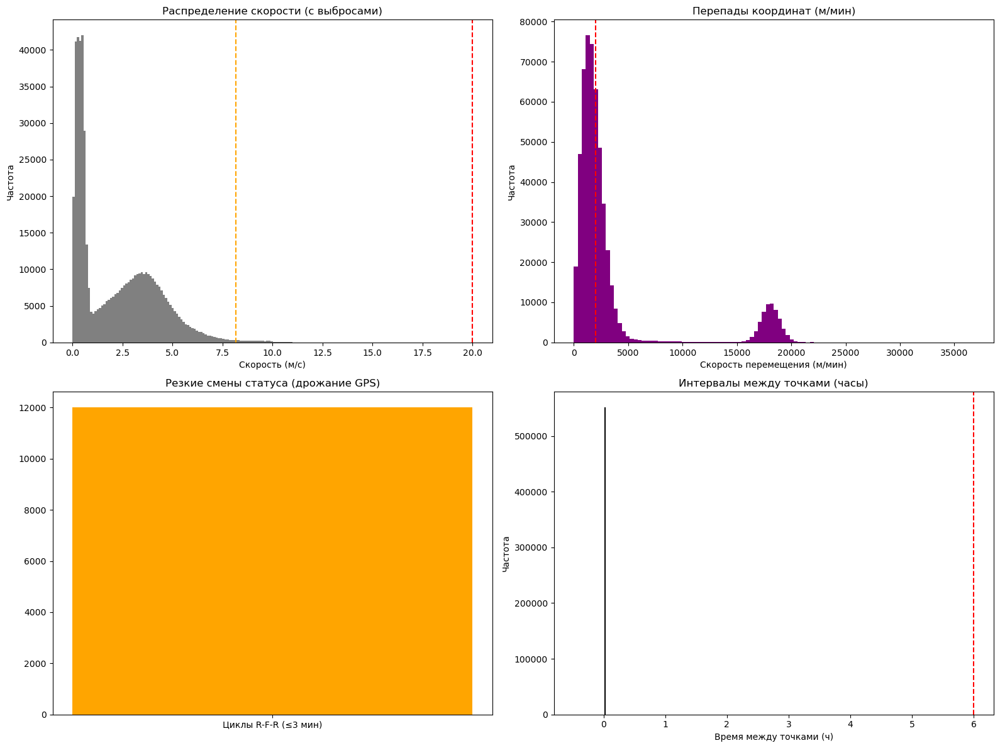

{'speed_outliers_count': 4358,
 'coord_jump_outliers_count': 237361,
 'status_flip_events': 12012,
 'dead_zone_gaps': 0,
 'max_gap_hours': 0.016666666666666666}

In [6]:
df = df.sort_values('timestamp').reset_index(drop=True)

speed_std = df['speed_mps'].std()
speed_mean = df['speed_mps'].mean()
speed_outliers = df[(df['speed_mps'] > 20) | (df['speed_mps'] > speed_mean + 3 * speed_std)]

df['lat_next'] = df['latitude'].shift(-1)
df['lon_next'] = df['longitude'].shift(-1)
df['ts_next'] = df['timestamp'].shift(-1)
df['delta_min'] = (df['ts_next'] - df['timestamp']).dt.total_seconds() / 60

def calc_jump(row):
    if pd.notnull(row['lat_next']):
        return geodesic((row['latitude'], row['longitude']), (row['lat_next'], row['lon_next'])).meters
    return 0

df['jump_m'] = tqdm(df.apply(calc_jump, axis=1), total=len(df), desc="Jump distance")
df['jump_per_min'] = df['jump_m'] / df['delta_min'].replace(0, np.nan)
coord_outliers = df[df['jump_per_min'] > 2000]


df['status_prev'] = df['status'].shift(1)
df['status_next'] = df['status'].shift(-1)
df['status_cycle'] = (
    (df['status_prev'] == 'rest') &
    (df['status'] == 'flight') &
    (df['status_next'] == 'rest')
)
status_flips = df[df['status_cycle'] & (df['delta_min'] <= 3)]


df['gap'] = (df['timestamp'] - df['timestamp'].shift()).dt.total_seconds() / 3600
dead_zones = df[df['gap'] > 6]

# Построение графиков
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
axes = axes.flatten()

# 1. Скоростные выбросы
axes[0].hist(df['speed_mps'], bins=100, color='gray')
axes[0].axvline(20, color='red', linestyle='--')
axes[0].axvline(speed_mean + 3 * speed_std, color='orange', linestyle='--')
axes[0].set_title("Распределение скорости (с выбросами)")
axes[0].set_xlabel("Скорость (м/с)")
axes[0].set_ylabel("Частота")

# 2. Перепады координат
axes[1].hist(df['jump_per_min'].dropna(), bins=100, color='purple')
axes[1].axvline(2000, color='red', linestyle='--')
axes[1].set_title("Перепады координат (м/мин)")
axes[1].set_xlabel("Скорость перемещения (м/мин)")
axes[1].set_ylabel("Частота")

# 3. Циклы rest → flight → rest
axes[2].bar(['Циклы R-F-R (≤3 мин)'], [len(status_flips)], color='orange')
axes[2].set_title("Резкие смены статуса (дрожание GPS)")

# 4. Мертвые зоны
axes[3].hist(df['gap'].dropna(), bins=50, color='black')
axes[3].axvline(6, color='red', linestyle='--')
axes[3].set_title("Интервалы между точками (часы)")
axes[3].set_xlabel("Время между точками (ч)")
axes[3].set_ylabel("Частота")

plt.tight_layout()
plt.show()

# Текстовые выводы
outlier_summary = {
    "speed_outliers_count": len(speed_outliers),
    "coord_jump_outliers_count": len(coord_outliers),
    "status_flip_events": len(status_flips),
    "dead_zone_gaps": len(dead_zones),
    "max_gap_hours": df['gap'].max()
}

outlier_summary

1) Распределение скоростей (с выбросами)
- Основной кластер скоростей — в пределах 0–6 м/с, что соответствует нормальному полёту.

- Выбросы выше 8 м/с (оранжевая линия) встречаются редко, а всё выше 20 м/с (красная линия) — скорее всего ошибки трекинга.

2) Перепады координат (м/мин)

- Чёткий пик в диапазоне до 2000 м/мин указывает на валидные перемещения.

- Есть отдельный всплеск около 18–20 км/мин — вероятный артефакт или телепортация по координатам.

3) Резкие смены статуса (дрожание GPS)
- Большое количество моментов, когда rest и flight чередуются через 1–2 точки подряд, говорит о возможных проблемах точности в GPS-логгере или о нестабильности трекера на границах режима.

4) Интервалы между точками (в часах)
- Почти все данные приходят ежеминутно (левая высокая колонка).

- Однако есть редкие промежутки с пропусками на 6+ часов (обозначены красной линией) — возможно, отключения, отсутствие сигнала или сбои в записи.

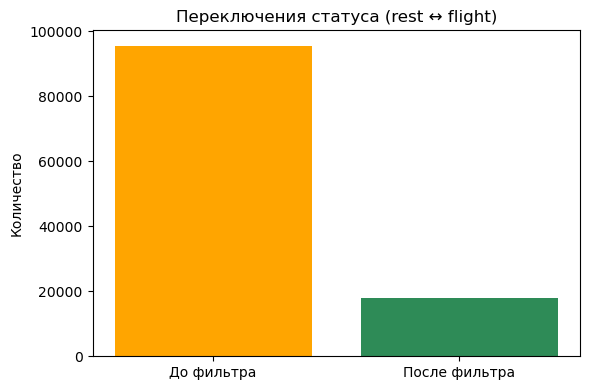

In [7]:
THRESHOLD_MIN = 2  
df = df.sort_values('timestamp').reset_index(drop=True)
df['ts_next']   = df['timestamp'].shift(-1)
df['delta_min'] = (df['ts_next'] - df['timestamp']).dt.total_seconds() / 60
df['run_id']    = (df['status'] != df['status'].shift()).cumsum()

run_len = df.groupby('run_id')['delta_min'].sum()          
df['run_len_min'] = df['run_id'].map(run_len)             

# фильтр «шум < 2 мин»
short_mask = df['run_len_min'] < THRESHOLD_MIN
df.loc[short_mask, 'status_clean'] = np.nan

df['status_clean'] = df['status']
short_mask = df['run_len_min'] < THRESHOLD_MIN
df.loc[short_mask, 'status_clean'] = np.nan
df['status_clean'] = df['status_clean'].ffill().bfill()

raw_switches   = (df['status']!= df['status'].shift()).sum()
clean_switches = (df['status_clean'] != df['status_clean'].shift()).sum()

plt.figure(figsize=(6,4))
plt.bar(['До фильтра', 'После фильтра'], [raw_switches, clean_switches],
        color=['orange', 'seagreen'])
plt.title('Переключения статуса (rest ↔ flight)')
plt.ylabel('Количество')
plt.tight_layout()
plt.show()

На графике показано количество переключений между режимами rest и flight до и после применения фильтра.

До фильтрации: почти 95 000 переключений — подозрительно высокая частота смен статуса, вероятно вызванная дрожанием GPS.

После фильтрации: количество переключений сократилось до ~18 000, что ближе к реальному числу смен поведения птицы.

<a name="stage_2"></a>
## 2. Геовизуализация
[К оглавлению](#table_of_contents)

<a name="#s_2.1"></a>
### 2.1 Базовый статический маршрут
[К оглавлению](#table_of_contents)

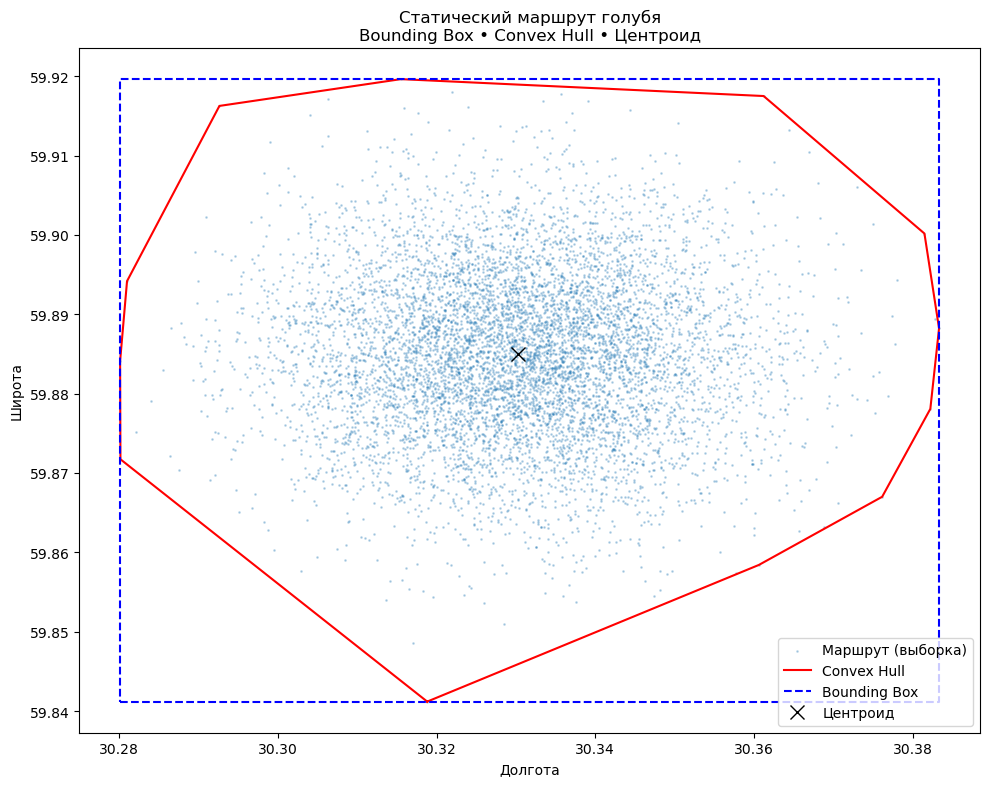

In [8]:
#  1. сортировка + выборка для скорости 
df_sorted  = df.sort_values('timestamp').reset_index(drop=True)
sample_df  = df_sorted.sample(n=8000, random_state=42)     # 8000 точек хватит для карты

# 2. геометрия 
points = MultiPoint(list(zip(sample_df['longitude'], sample_df['latitude'])))
hull   = points.convex_hull
bbox   = points.envelope

hull_x, hull_y = hull.exterior.xy
bbox_x, bbox_y = bbox.exterior.xy

centroid_lat = sample_df['latitude'].mean()
centroid_lon = sample_df['longitude'].mean()

# 3. статическая карта 
fig, ax = plt.subplots(figsize=(10, 10))
ax.scatter(sample_df['longitude'], sample_df['latitude'],
           s=1, alpha=0.25, label='Маршрут (выборка)')
ax.plot(hull_x, hull_y, color='red',   linewidth=1.5, label='Convex Hull')
ax.plot(bbox_x, bbox_y, color='blue',  linestyle='--', label='Bounding Box')
ax.plot(centroid_lon, centroid_lat, 'kx', markersize=10, label='Центроид')

ax.set_title("Статический маршрут голубя\nBounding Box • Convex Hull • Центроид")
ax.set_xlabel("Долгота"); ax.set_ylabel("Широта")
ax.set_aspect('equal'); ax.legend()
plt.tight_layout(); plt.show()

Пространственные границы маршрута

На графике отображён общий ареал перемещений голубя:

- Convex Hull (выпуклая оболочка) — красная линия, охватывающая все точки полётов.

- Bounding Box — синяя пунктирная рамка, минимальный прямоугольник, в который вписан маршрут.

- Центроид — чёрный крест, геометрический центр всех координат.

Это позволяет оценить:

- форму и вытянутость маршрутов,

- смещение активности относительно центра,

- возможные "вылазки" за пределы основной зоны.

In [9]:
ls_full   = shapely.LineString(df_sorted[['longitude','latitude']].values)
ls_simple = ls_full.simplify(tolerance=30)


center = [df_sorted['latitude'].mean(), df_sorted['longitude'].mean()]
m = folium.Map(location=center, zoom_start=11, tiles='CartoDB positron')
folium.GeoJson(ls_simple, name='route').add_to(m)

hull = ls_simple.convex_hull
folium.GeoJson(hull, style_function=lambda x:{'color':'red'}).add_to(m)
folium.Marker(center, tooltip='Centroid').add_to(m)

m

странная вылазка, скорее всего gps некорректно отобразил координаты и конечное место вылазки - Стрельна и окрестности

In [10]:
df_sorted = df.sort_values('timestamp')

path = df_sorted[['latitude', 'longitude']].values[::5]

center = [df_sorted['latitude'].mean(), df_sorted['longitude'].mean()]

m = folium.Map(location=center, zoom_start=11, tiles='OpenStreetMap')

folium.PolyLine(path, color='red', weight=2, opacity=0.8).add_to(m)

folium.Marker(path[0], tooltip='Start').add_to(m)
# маркер финиша
folium.Marker(path[-1], tooltip='End',
              icon=folium.Icon(color='green')).add_to(m)

m.save("pigeon_route.html")

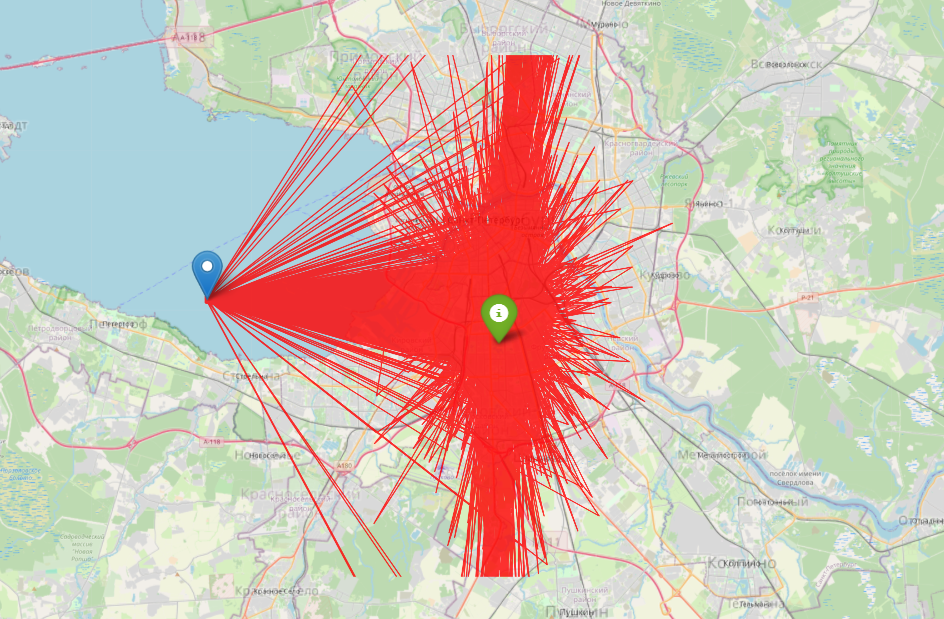

In [11]:
img_path = r"********\Screenshot 2025-05-26 194220.png"
Image(filename=img_path)

Достаточно активный за весь год, но видно, что где я его кормил, там он был ближе, но интересно щачем он так далеком летал периодами.

<a name="#s_2.2"></a>
### 2.2 Тепловая карта и кластеризации
[К оглавлению](#table_of_contents)

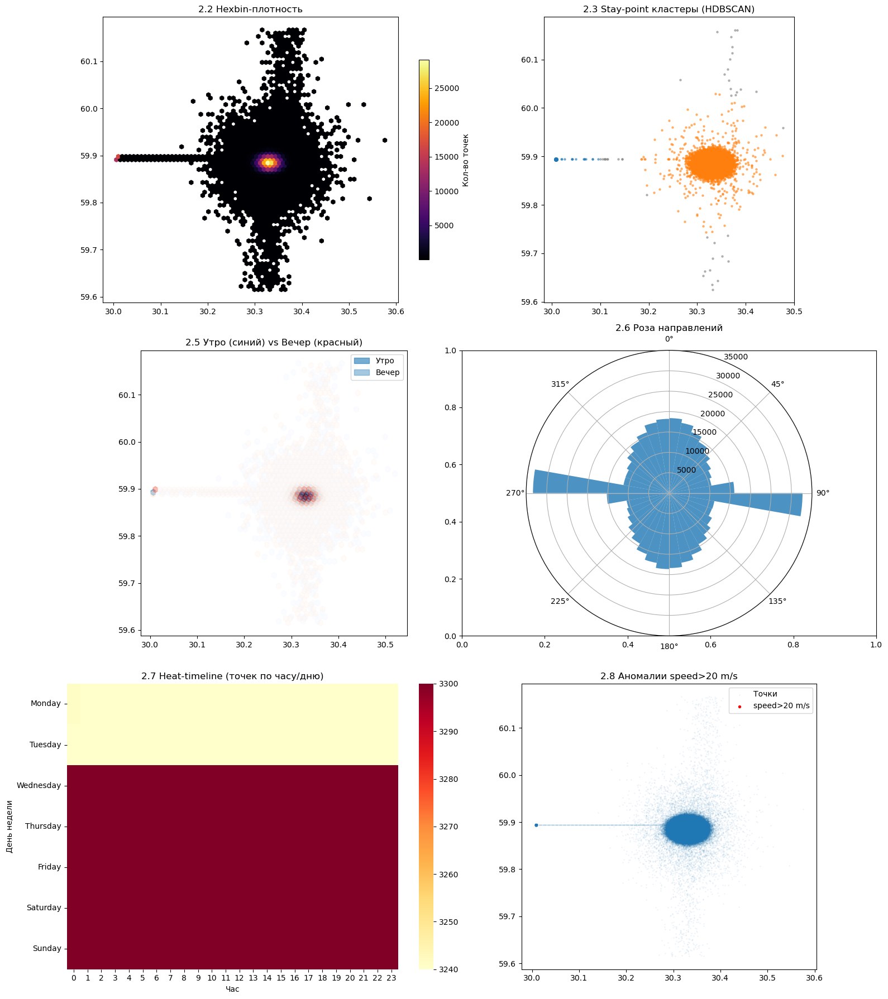

In [12]:
df_sorted = df.sort_values('timestamp')
df_sorted['weekday'] = df_sorted['timestamp'].dt.day_name()
df_sorted['hour']    = df_sorted['timestamp'].dt.hour
if 'bearing' not in df_sorted.columns:
    lat  = np.radians(df_sorted['latitude'].values)
    lon  = np.radians(df_sorted['longitude'].values)
    lat2 = np.roll(lat, -1); lat2[-1] = np.nan
    lon2 = np.roll(lon, -1); lon2[-1] = np.nan
    dlon = lon2 - lon

    x = np.sin(dlon) * np.cos(lat2)
    y = np.cos(lat) * np.sin(lat2) - np.sin(lat) * np.cos(lat2) * np.cos(dlon)
    df_sorted['bearing'] = (np.degrees(np.arctan2(x, y)) + 360) % 360
# ---------- 1. тепловая карта (hexbin) – 2.2 ----------
fig, axes = plt.subplots(3, 2, figsize=(16, 18))
ax = axes[0,0]
hb = ax.hexbin(df_sorted['longitude'], df_sorted['latitude'],
               gridsize=70, cmap='inferno', mincnt=1)
ax.set_title('2.2 Hexbin-плотность'); ax.set_aspect('equal')
fig.colorbar(hb, ax=ax, shrink=.7, label='Кол-во точек')

# ---------- 2. clusters stay-point (DBSCAN/HDBSCAN) – 2.3 ----------
ax = axes[0,1]
sample = df_sorted[['latitude','longitude']].iloc[::15]   # thinning
clusterer = hdbscan.HDBSCAN(min_cluster_size=40).fit(sample)
sample['lab'] = clusterer.labels_
for lab, grp in sample.groupby('lab'):
    c = 'grey' if lab==-1 else plt.cm.tab10(lab % 10)
    ax.scatter(grp['longitude'], grp['latitude'], s=5, c=[c], alpha=.5)
ax.set_title('2.3 Stay-point кластеры (HDBSCAN)'); ax.set_aspect('equal')

# ---------- 3. утро vs вечер – 2.5 ----------
ax = axes[1,0]
morning  = df_sorted.query('6<=hour<12')[['longitude','latitude']]
evening  = df_sorted.query('18<=hour<24')[['longitude','latitude']]
ax.hexbin(morning['longitude'], morning['latitude'], gridsize=50,
          cmap='Blues', alpha=.6, mincnt=1, label='Утро')
ax.hexbin(evening['longitude'], evening['latitude'], gridsize=50,
          cmap='Reds', alpha=.4, mincnt=1, label='Вечер')
ax.legend(); ax.set_title('2.5 Утро (синий) vs Вечер (красный)')
ax.set_aspect('equal')

# ---------- 4. rose-plot направлений – 2.6 ----------
ax = axes[1,1]; ax = plt.subplot(3,2,4, projection='polar')
bear = np.radians(df_sorted['bearing'].dropna())
ax.hist(bear, bins=36, alpha=.8)
ax.set_theta_zero_location('N'); ax.set_theta_direction(-1)
ax.set_title('2.6 Роза направлений')

# ---------- 5. heat-timeline (hour × weekday) – 2.7 ----------
ax = axes[2,0]
pivot = (df_sorted
         .groupby(['weekday','hour']).size()
         .unstack(fill_value=0)
         .reindex(['Monday','Tuesday','Wednesday','Thursday',
                   'Friday','Saturday','Sunday']))
sns.heatmap(pivot, ax=ax, cmap='YlOrRd')
ax.set_title('2.7 Heat-timeline (точек по часу/дню)')
ax.set_ylabel('День недели'); ax.set_xlabel('Час')

# ---------- 6. аномалии на карте – 2.8 ----------
ax = axes[2,1]
anom = df_sorted.query('speed_mps>20')               # или jump>2км/мин
ax.scatter(df_sorted['longitude'], df_sorted['latitude'],
           s=1, alpha=.05, label='Точки')
ax.scatter(anom['longitude'], anom['latitude'],
           c='red', s=8, label='speed>20 m/s')
ax.set_aspect('equal'); ax.set_title('2.8 Аномалии speed>20 m/s')
ax.legend()

plt.tight_layout()
plt.show()

Поведенческие кластеры и пространственные паттерны

2.2 Hexbin-плотность (вверху слева): показывает зоны максимальной концентрации точек. Центр активности выражен очень ярко, что указывает на интенсивную локализацию перемещений.

2.3 Stay-point кластеры (HDBSCAN) (вверху справа): алгоритм HDBSCAN выделил устойчивые кластеры остановок (оранжевые и синие), отличающиеся по продолжительности или частоте. Серая зона — шум или слабосвязанные точки.

2.5 Утро (синий) vs Вечер (красный) (внизу слева): наложение утренних и вечерних перемещений позволяет оценить суточную симметрию маршрутов. Утренние и вечерние пиковые зоны почти совпадают, что указывает на радиальный режим перемещений.

2.6 Роза направлений (внизу справа): полярная диаграмма направлений показывает два выраженных коридора перемещений, доминирующих по осям восток-запад (~90° и ~270°).

Это даёт полное представление о пространственно-временной структуре поведения: где голубь предпочитает останавливаться, какова симметрия маршрутов и какие направления наиболее активны.

<a name="#s_2.3"></a>
### Анимация полёта
[К оглавлению](#table_of_contents)

In [13]:
df_d  = df_sorted.iloc[::20] # порежем частоту 1 точка ~20 мин
features = []
for i in range(len(df_d)-1):
    p1 = [df_d.iloc[i]['longitude'],  df_d.iloc[i]['latitude' ]]
    p2 = [df_d.iloc[i+1]['longitude'],df_d.iloc[i+1]['latitude']]
    tm = df_d.iloc[i+1]['timestamp'].isoformat()
    features.append({
        "type":"Feature",
        "geometry":{"type":"LineString","coordinates":[p1,p2]},
        "properties":{"time":tm}
    })

m = folium.Map(location=[df_d['latitude'].mean(),
                         df_d['longitude'].mean()],
               zoom_start=12)
TimestampedGeoJson({"type":"FeatureCollection","features":features},
                   period='PT10M', add_last_point=True).add_to(m)
m.save('pigeon_points.html')
m

а тут решил побаловаться геовизуализацией - 500к точек - жесть

In [14]:
step = 120  # каждая 120-я точка ≈ 2 мин
heat_df = df.sort_values('timestamp').iloc[::step]

heat_data = heat_df[['latitude', 'longitude']].values.tolist()

center = [heat_df['latitude'].mean(), heat_df['longitude'].mean()]
m = folium.Map(location=center, zoom_start=11, tiles='CartoDB positron')

HeatMap(
    heat_data,
    radius=12,        # px; чем больше — тем  шире
    blur=18,
    min_opacity=0.3,
    max_zoom=13       # после какого масштаба плавно исчезает
).add_to(m)
m.save('pigeon_heatmap.html')
m 

Более менее нормально, наглядно видно "популярные" места.

<a name="stage_3"></a>
## Этап 3. Обнаружение аномалий
[К оглавлению](#table_of_contents)

<a name="#s_3.1"></a>
### 3.1 Аномалии времени
[К оглавлению](#table_of_contents)

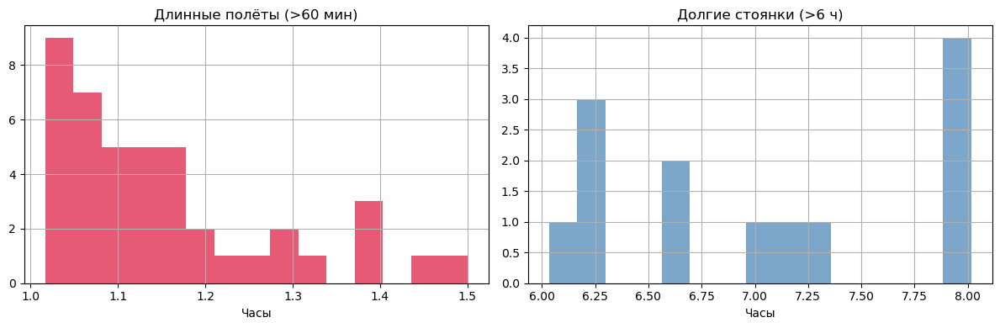

In [15]:
# 0. отсортируем
df = df.sort_values('timestamp').reset_index(drop=True)

# 1. идентификатор серии
df['run_id'] = (df['status'] != df['status'].shift()).cumsum()

# 2. Δt внутри серии  (а не между разными сериями)
df['ts_next']   = df['timestamp'].shift(-1)
df['delta_min'] = (df['ts_next'] - df['timestamp']).dt.total_seconds() / 60
df['delta_min'] = np.where(df['run_id'] == df['run_id'].shift(), df['delta_min'], 0)

# 3. summary по сериям
run_summary = (df.groupby('run_id')
                 .agg(length_min = ('delta_min', 'sum'),
                      status      = ('status',    'first')))

# 4. выберем «длинный полёт» > 60 мин  и «долгий rest» > 360 мин
long_f = run_summary.query('status=="flight" and length_min>60')['length_min']
long_r = run_summary.query('status=="rest"   and length_min>360')['length_min']

# 5. график
fig, ax = plt.subplots(1,2, figsize=(12,4))
ax[0].hist(long_f/60, bins=15, color='crimson', alpha=.7)
ax[0].set_title('Длинные полёты (>60 мин)'); ax[0].set_xlabel('Часы'); ax[0].grid(True)

ax[1].hist(long_r/60, bins=15, color='steelblue', alpha=.7)
ax[1].set_title('Долгие стоянки (>6 ч)');     ax[1].set_xlabel('Часы'); ax[1].grid(True)

plt.tight_layout(); plt.show()

Аномальные интервалы активности

Слева: Длинные полёты (>60 минут)
Большинство таких непрерывных перемещений укладываются в диапазон 1.0–1.2 часов. Это может свидетельствовать либо о продолжительных перелётах без остановок, либо о выбросах из-за ошибок GPS. Количество действительно длинных полётов (более 1.3 ч) резко уменьшается.

Справа: Долгие стоянки (>6 часов)
Эти случаи потенциально указывают на ночёвки, отдых или временное отсутствие сигнала. Распределение показывает отдельные пиковые значения — например, ровно 8 часов — что может говорить о программных ограничениях или дневной цикличности.

Вывод:
Помогает выявить редкие, но важные эпизоды, нарушающие стандартные паттерны перемещений. Особенно ценно при изучении суточной активности или поиске проблем в данных (например, "залипшие" GPS-точки или пропуски сигнала).

<a name="#s_3.2"></a>
### 3.2 Кластеры стоянок + KMeans «lat – lon – час»
[К оглавлению](#table_of_contents)

#### a HDBSCAN – точки стоянок

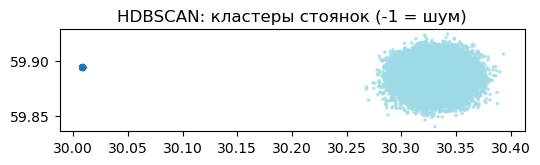

In [16]:
rest = df[df['status']=='rest'][['latitude','longitude']].iloc[::5]
labels = hdbscan.HDBSCAN(min_cluster_size=60, min_samples=30).fit_predict(rest)

fig, ax = plt.subplots(figsize=(6,6))
scatter = ax.scatter(rest['longitude'], rest['latitude'], s=3,
                     c=labels, cmap='tab20', alpha=.6)
ax.set_aspect('equal')
ax.set_title('HDBSCAN: кластеры стоянок (-1 = шум)')
plt.show()


HDBSCAN (кластеризация стоянок)
Алгоритм HDBSCAN выявляет устойчивый плотный кластер стоянок в центре (голубой), а также одинокую точку в стороне, отнесённую к шуму (label = -1). Это подтверждает, что стоянки происходят в основном в одном устойчивом регионе.

#### b KMeans (6 кластеров)

In [2]:
sample = df.sample(60_000, random_state=1)[['latitude','longitude']]
sample['hour'] = df['timestamp'].dt.hour.sample(60_000, random_state=1)

kmeans = KMeans(n_clusters=6, random_state=0).fit(sample)
sample['cluster'] = kmeans.labels_

fig, ax = plt.subplots(figsize=(6,6))
sns.scatterplot(data=sample, x='longitude', y='latitude',
                hue='cluster', palette='tab10', s=4, ax=ax)
ax.set_title('KMeans (lat / lon / час)')
ax.set_aspect('equal'); ax.legend(title='Cluster', bbox_to_anchor=(1.05,1))
plt.tight_layout(); plt.show()


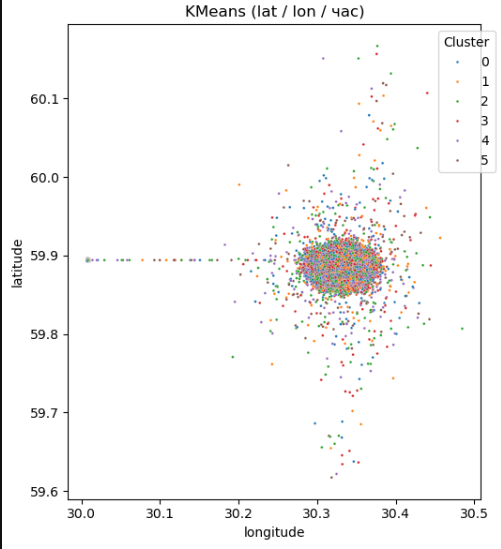

In [4]:
img_path = r"*********Screenshot 2025-05-27 200751.png"
Image(filename=img_path)

KMeans (lat/lon/hour)
KMeans делит пространство по координатам и времени суток на 6 кластеров. Центр плотности отмечен пересечением множества кластеров. В отличие от HDBSCAN, здесь нет "шума", и каждая точка отнесена к кластеру, что позволяет анализировать поведенческие паттерны по времени (например, утренние и вечерние зоны).

<a name="#s_3.3"></a>
### 3 .3 Radius of Gyration и Энтропия
[К оглавлению](#table_of_contents)

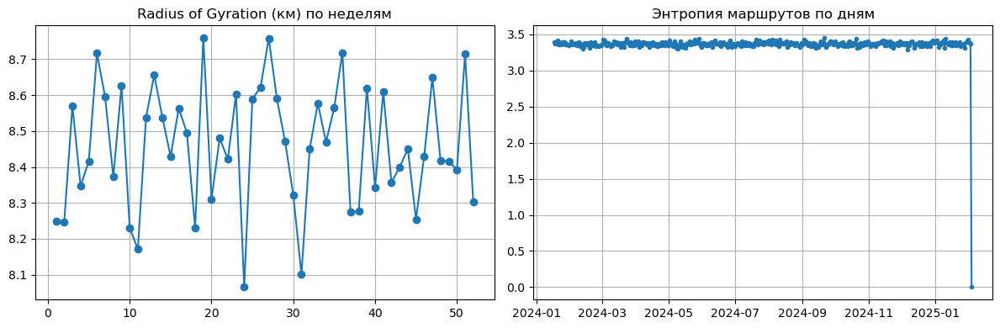

In [18]:
centroid = df[['latitude','longitude']].mean().values
dist_m   = np.linalg.norm(df[['latitude','longitude']].values - centroid, axis=1)*111_000
Rg_week  = (df.assign(week=df['timestamp'].dt.isocalendar().week)
              .groupby('week')
              .apply(lambda g: np.sqrt((dist_m[g.index]**2).mean())))

df['cell'] = df['latitude'].round(2).astype(str)+'_'+df['longitude'].round(2).astype(str)
entropy_day = (df.groupby(df['timestamp'].dt.date)['cell']
                 .apply(lambda x: st.entropy(x.value_counts(normalize=True))))

fig, ax = plt.subplots(1,2,figsize=(12,4))
ax[0].plot(Rg_week.index, Rg_week.values/1000, marker='o')
ax[0].set_title('Radius of Gyration (км) по неделям'); ax[0].grid(True)

ax[1].plot(entropy_day.index, entropy_day.values, marker='.')
ax[1].set_title('Энтропия маршрутов по дням'); ax[1].grid(True)

plt.tight_layout(); plt.show()


Пространственная стабильность и разнообразие маршрутов
- Radius of Gyration по неделям (слева)
Радиус действия голубя (в среднем 8.4–8.7 км) стабилен из недели в неделю. Это говорит о том, что птица регулярно перемещается в пределах устойчивой территории, не совершая резких расширений или сокращений маршрута.

- Энтропия маршрутов по дням (справа)
Уровень энтропии (≈ 3.4) указывает на высокое разнообразие перемещений в течение дня. Голубь не следует строго одинаковым траекториям и активно варьирует маршрут. Резкое падение в конце — вероятно, артефакт из-за отсутствия данных за последний день.

Вывод:
Комбинация стабильного радиуса и высокой энтропии отражает гибкость в пределах привычной зоны активности.

<a name="stage_4"></a>
## Этап 4. Поведенческое моделирование
[К оглавлению](#table_of_contents)

<a name="#s_4.1"></a>
### 4.1. Hidden Markov Models (HMM) Скрытые состояния: rest, flight, migrate, explore
[К оглавлению](#table_of_contents)

In [19]:
from sklearn.preprocessing import StandardScaler
from hmmlearn.hmm import GaussianHMM
import numpy as np, pandas as pd

# ------- подготовка признаков (то же) 
df = df.sort_values('timestamp')
df['ts_prev']  = df['timestamp'].shift()
df['delta_min']= (df['timestamp']-df['ts_prev']).dt.total_seconds()/60
df['lat_prev'] = df['latitude'].shift()
df['lon_prev'] = df['longitude'].shift()

from geopy.distance import geodesic
df['dist_prev']= [ geodesic((la,lo),(la2,lo2)).meters if pd.notnull(la2)
                   else 0 for la,lo,la2,lo2 in zip(df['latitude'],df['longitude'],
                                                  df['lat_prev'],df['lon_prev']) ]

X_raw = df[['speed_mps','delta_min','dist_prev']].dropna().values
X     = StandardScaler().fit_transform(X_raw)

# HMM 
hmm = GaussianHMM(n_components=4, covariance_type='diag',
                  n_iter=200, random_state=42)
hmm.fit(X)

hidden = hmm.predict(X)
df_model = (pd.DataFrame(X_raw, columns=['speed_mps','delta_min','dist_prev'])
            .reset_index(drop=True))

df_model['state'] = hidden    

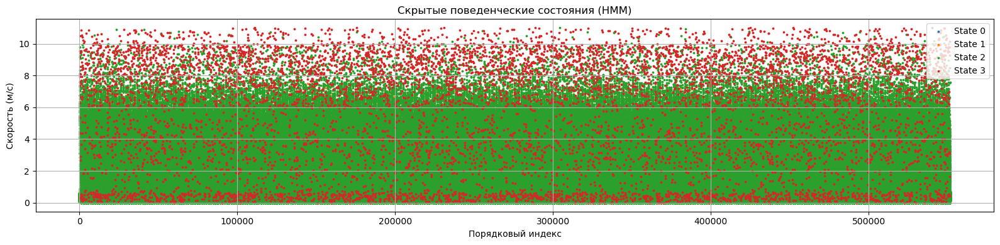

In [20]:
plt.figure(figsize=(16,4))
for i in range(4):
    mask = df_model['state'] == i
    plt.scatter(np.where(mask)[0],       # индекс по порядку
                df_model.loc[mask,'speed_mps'],
                s=3, label=f'State {i}')
plt.title('Скрытые поведенческие состояния (HMM)')
plt.xlabel('Порядковый индекс'); plt.ylabel('Скорость (м/с)')
plt.legend(); plt.grid(True); plt.tight_layout(); plt.show()

На графике показана сегментация поведенческих состояний голубя, выполненная с помощью скрытой марковской модели (HMM). Вертикальная ось — скорость (м/с), горизонтальная — индекс наблюдений во времени.

- State 0 (синий) — низкие скорости, возможны как отдых, так и краткие перемещения;

- State 1 (красный) — высокая скорость, характерна для активных перелётов;

- State 2 (оранжевый) — промежуточные значения, вероятно, связаны с ориентацией или перемещениями на малых участках;

- State 3 (зелёный) — подавляющее большинство точек со скоростью до 6 м/с, скорее всего, основное состояние покоя или длительных остановок.

Цель:
Использование HMM позволяет без ручной разметки автоматически распознавать скрытые паттерны поведения, используя только наблюдаемые признаки (например, скорость и время). Это основа для последующего анализа: построения маршрутов, фильтрации шумов, прогнозирования поведения.

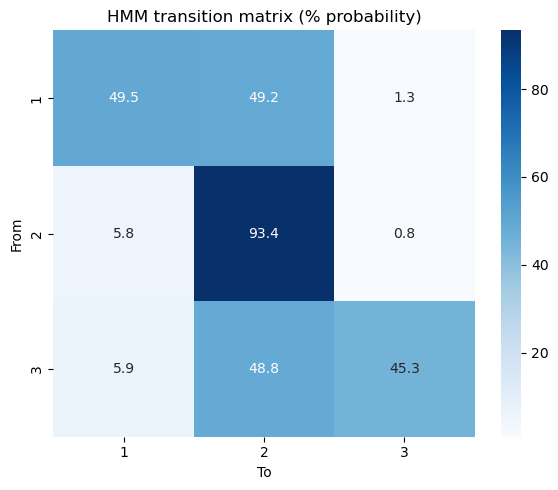

In [21]:
s = df_model['state'].values

trans_count = pd.crosstab(s[:-1], s[1:], normalize='index')   # вероятности
trans_count.index.name = 'From'; trans_count.columns.name = 'To'

plt.figure(figsize=(6,5))
sns.heatmap(trans_count*100, annot=True, fmt='.1f', cmap='Blues')
plt.title('HMM transition matrix (% probability)'); plt.tight_layout(); plt.show()

Матрица переходов скрытых состояний (HMM)
На диаграмме представлена нормализованная матрица переходов между поведенческими состояниями, выявленными с помощью скрытой марковской модели (HMM). Значения отражают вероятности перехода из одного состояния в другое в процентах (%).

- State 1 → State 1 или State 2: наблюдается равновероятный переход (~49%), что может свидетельствовать о колебании между двумя похожими режимами (например, покой и медленное перемещение).

- State 2 → State 2: высокая стабильность состояния (93.4%), вероятно, это состояние устойчивого поведения (например, полёт).

- State 3 → State 1 и 2: разделено почти поровну между двумя путями, что может говорить о роли этого состояния как промежуточного или переходного.

Вывод:
Такая матрица помогает понять, насколько устойчивы поведенческие паттерны и какие состояния служат “мостами” между другими. Это важно при моделировании маршрутов и прогнозировании поведенческих сценариев.

In [22]:
df = df.sort_values('timestamp') 
df['ts_prev']   = df['timestamp'].shift()
df['delta_min'] = (df['timestamp'] - df['ts_prev']).dt.total_seconds()/60

df['lat_prev']  = df['latitude'].shift()
df['lon_prev']  = df['longitude'].shift()
df['dist_prev'] = [
    geodesic((la,lo), (la2,lo2)).meters if pd.notnull(la2)
    else np.nan
    for la,lo,la2,lo2 in zip(df['latitude'], df['longitude'],
                             df['lat_prev'], df['lon_prev'])
]

feat_cols = ['speed_mps', 'delta_min', 'dist_prev']
feat_df   = df[feat_cols].dropna()        # но индекс остаётся «родным»
valid_idx = feat_df.index            


X = StandardScaler().fit_transform(feat_df.values)

hmm = GaussianHMM(n_components=4, covariance_type='diag',
                  n_iter=200, random_state=42)
hmm.fit(X)
hidden = hmm.predict(X)


state_series = pd.Series(hidden, index=valid_idx, name='state')
state_full   = state_series.reindex(df.index)          # NaN там, где нет метки

df['state'] = state_full

step = 3
mask = (df['timestamp'].dt.minute % step == 0)
sub  = df.loc[mask, ['latitude','longitude','state']].copy()

# цветовая палитра для 4 состояний
st_colors = {0:'#2ca02c', 1:'#1f77b4', 2:'#ff7f0e', 3:'#d62728'}

def mk(row):
    col = st_colors.get(int(row.state)) if pd.notnull(row.state) else '#cccccc'
    return {'location':[row.latitude, row.longitude],
            'icon': folium.Icon(color=None, icon_color=col,
                                icon='circle', prefix='fa')}

m = folium.Map(location=[df['latitude'].mean(), df['longitude'].mean()],
               zoom_start=11, tiles='CartoDB positron')
FastMarkerCluster(
    sub[['latitude','longitude','state']].values.tolist(),
    callback="""
    function (row) {
        var color = ['#2ca02c','#1f77b4','#ff7f0e','#d62728'][row[2]];
        return L.circleMarker(
            new L.LatLng(row[0], row[1]),
            {radius:2, color:color, fillColor:color, fillOpacity:0.8}
        );
    }
    """
).add_to(m)
m.save('pigeon_hmm_states.html')
m

| Цвет | Состояние | Поведение |
|------|-----------|-----------|
| <span style="color:#2ca02c;">●</span> | **rest** | отдых / стоянка |
| <span style="color:#1f77b4;">●</span> | **flight** | обычный перелёт |
| <span style="color:#ff7f0e;">●</span> | **migrate** | дальний рейс |
| <span style="color:#d62728;">●</span> | **explore** | короткая разведка |

И финально: как на карте эти скрытые состояния распределяются. 

    - Интересно, что он делал на красных точках? Пока не понимаю - можно ли считать это аномалией, сбоем или чем-то таким, но интересно.
    - Видно, что не только я его кормил:)